# Random  Forest on Amazon Fine Food reviews

# 1.Loading the data

In [0]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import BernoulliNB
from tqdm import tqdm

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV


import seaborn as sns
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from scipy.stats import uniform
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform


In [0]:
!pip install -U -q PyDrive

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth

from oauth2client.client import GoogleCredentials

# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)



In [0]:
download = drive.CreateFile({'id': '1K1rpp1cP61oOjKc9CIx-0v4z2SdyOpyi'})
download.GetContentFile('final.sqlite')

In [0]:
con = sqlite3.connect('final.sqlite')
final = pd.read_sql_query(""" SELECT * FROM Reviews""", con) 


## 2 Spliting CleanedText and Score into train and test

In [8]:
final=final.sort_values(by=['Time'],ascending=False)
finalDataPoints=final.head(1000)
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.cross_validation import cross_val_score
from collections import Counter
from sklearn.metrics import accuracy_score
from sklearn import cross_validation

x=finalDataPoints["CleanedText"]
y=finalDataPoints["Score"]



x_tr,x_test,y_tr,y_test=train_test_split(x, y, test_size=0.2,shuffle=False)

/usr/local/lib/python3.6/dist-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [9]:
print(x_tr.shape,x_test.shape,y_tr.shape,y_test.shape)

(800,) (200,) (800,) (200,)


# 3.Bag of Words (BoW)

## 3.1 Unigram

In [0]:
#BOW for unigram
bow = CountVectorizer()
x_tr_uni = bow.fit_transform(x_tr)
x_test_uni= bow.transform(x_test)

## 3.1.1 Grid search

### 3.1.1.1 Finding the optimal nEstimator & depth using gridsearch

Fitting 5 folds for each of 272 candidates, totalling 1360 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:   49.3s
[Parallel(n_jobs=-1)]: Done 570 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 920 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 1360 out of 1360 | elapsed:  9.2min finished


Best HyperParameter:  {'max_depth': 150, 'n_estimators': 12}
0.8538573964585264


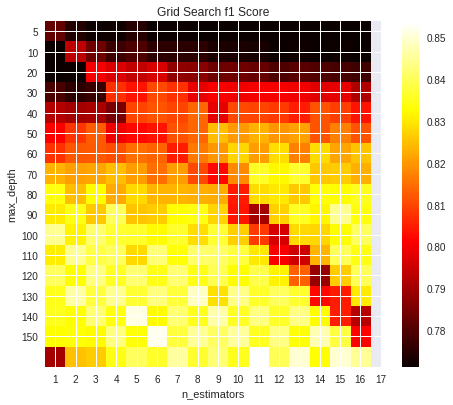

In [0]:
nEstimator = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
depth = [5,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]

RF = RandomForestClassifier()
hyperParam = [{'n_estimators':nEstimator,'max_depth': depth}]
gsv = GridSearchCV(RF,hyperParam,cv=5,verbose=1,scoring='f1_weighted',n_jobs=-1)
gsv.fit(x_tr_uni,y_tr)
print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)
scores = gsv.cv_results_['mean_test_score'].reshape(len(nEstimator),len(depth))

plt.figure(figsize=(8, 6))
plt.subplots_adjust(left=.2, right=0.95, bottom=0.15, top=0.95)
plt.imshow(scores, interpolation='nearest', cmap=plt.cm.hot)
plt.xlabel('n_estimators')
plt.ylabel('max_depth')
plt.colorbar()
plt.xticks(np.arange(len(nEstimator)), nEstimator)
plt.yticks(np.arange(len(depth)), depth)
plt.title('Grid Search f1 Score')
plt.show()

### 3.1.1.2 finding the accuracy,F1-score in Test data using optimal nEstimator & depth

Accuracy on test set: 87.030%
Precision on test set: 0.835
Recall on test set: 0.672
F1-Score on test set: 0.713


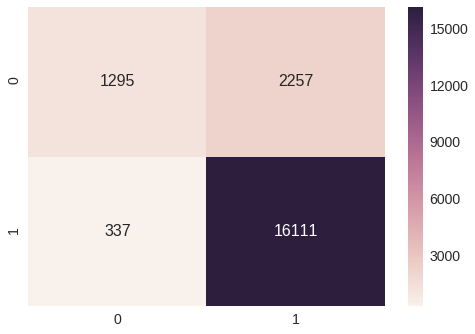

In [0]:
RF= RandomForestClassifier(n_estimators=12,max_depth=150)
RF.fit(x_tr_uni,y_tr)
y_pred =RF.predict(x_test_uni)
print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

## 3.1.2 RandomSearchCV

### 3.1.2.1 Finding the optimal nEstimator & depth using RandomSearchCv

In [0]:
nEstimator = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
depth = [5,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]

RF = RandomForestClassifier()
hyperParam = {'n_estimators':nEstimator,'max_depth': depth}
gsv = RandomizedSearchCV(RF,hyperParam,cv=5,verbose=1,scoring='f1_weighted')
gsv.fit(x_tr_uni,y_tr)
print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   28.7s finished


Best HyperParameter:  {'n_estimators': 8, 'max_depth': 140}
0.851137952101872


### 3.1.2.2 finding the accuracy,F1-score in Test data using optimal nEstimator & depth

Accuracy on test set: 85.595%
Precision on test set: 0.787
Recall on test set: 0.648
F1-Score on test set: 0.681


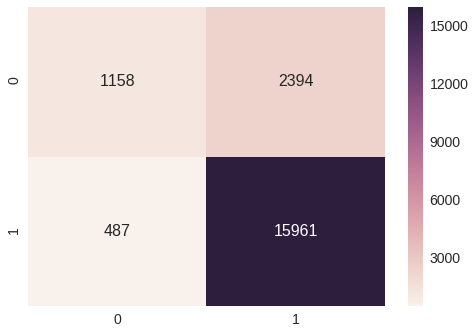

In [0]:
RF= RandomForestClassifier(n_estimators=8,max_depth=140)
RF.fit(x_tr_uni,y_tr)
y_pred =RF.predict(x_test_uni)
print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

## 3.1.3 Feature Importance

In [0]:
RF= RandomForestClassifier(n_estimators=12,max_depth=150)
RF.fit(x_tr_uni,y_tr)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=150, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=12, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [0]:
features=(-RF.feature_importances_).argsort()
print(np.take(bow.get_feature_names(), features))

['return' 'disappoint' 'wast' ... 'heartili' 'hearburn' 'zuppa']


## 3.1.4 RandomForest visualisation 

In [0]:
RF= RandomForestClassifier(n_estimators=12,max_depth=150)
RF.fit(x_tr_uni,y_tr)
estimator = RF.estimators_[5]
x_tr_uni_graphviz1=x_tr_uni.todense()
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(estimator,feature_names=bow.get_feature_names(), out_file=dot_data,rounded = True, proportion = False,precision = 2, filled = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## 3.2 Bi-Grams


In [0]:
bi_gram = CountVectorizer(ngram_range=(1,2))
x_tr_bi = bi_gram.fit_transform(x_tr)
x_test_bi = bi_gram.transform(x_test)

## 3.2.1.1 GridSeach

### 3.2.1.1 Finding the optimal nEstimator & depth  using gridsearchcv

Fitting 5 folds for each of 272 candidates, totalling 1360 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:   47.4s
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed: 26.0min
[Parallel(n_jobs=-1)]: Done 1360 out of 1360 | elapsed: 31.2min finished


Best HyperParameter:  {'max_depth': 140, 'n_estimators': 4}
0.8333697441556713


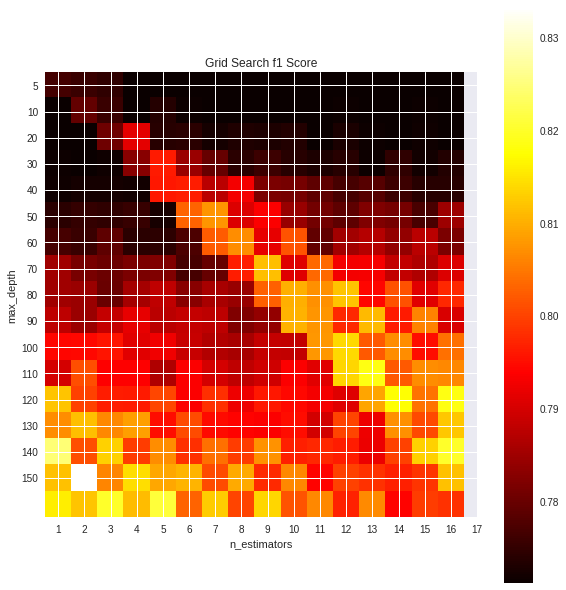

In [0]:
nEstimator = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
depth = [5,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]

RF = RandomForestClassifier()
hyperParam = [{'n_estimators':nEstimator,'max_depth': depth}]
gsv = GridSearchCV(RF,hyperParam,cv=5,verbose=1,scoring='f1_weighted',n_jobs=-1)
gsv.fit(x_tr_bi,y_tr)
print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)
scores = gsv.cv_results_['mean_test_score'].reshape(len(nEstimator),len(depth))

plt.figure(figsize=(10,10))
plt.subplots_adjust(left=.2, right=0.95, bottom=0.15, top=0.95)
plt.imshow(scores, interpolation='nearest', cmap=plt.cm.hot)
plt.xlabel('n_estimators')
plt.ylabel('max_depth')
plt.colorbar()
plt.xticks(np.arange(len(nEstimator)), nEstimator)
plt.yticks(np.arange(len(depth)), depth)
plt.title('Grid Search f1 Score')
plt.show()

### 3.2.1.2 finding the accuracy in Test data using optimal nEstimator & depth

Accuracy on test set: 83.510%
Precision on test set: 0.761
Recall on test set: 0.561
F1-Score on test set: 0.566


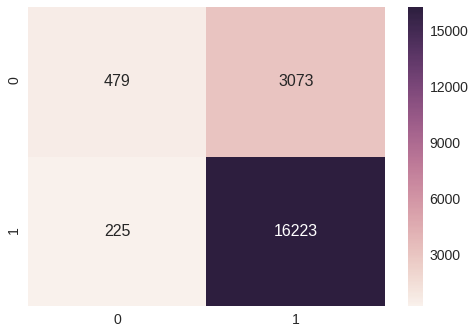

In [0]:
RF= RandomForestClassifier(n_estimators=4,max_depth=140)
RF.fit(x_tr_bi,y_tr)
y_pred =RF.predict(x_test_bi)
print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

## 3.2.1.2 Randomseachcv

### 3.2.1.1 Finding the optimal nEstimator & depth using RandomSearchCv

In [0]:
nEstimator = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
depth = [5,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]

RF = RandomForestClassifier()
hyperParam = {'n_estimators':nEstimator,'max_depth': depth}
gsv = RandomizedSearchCV(RF,hyperParam,cv=5,verbose=1,scoring='f1_weighted',n_jobs=-1)
gsv.fit(x_tr_bi,y_tr)
print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   34.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   36.0s finished


Best HyperParameter:  {'n_estimators': 8, 'max_depth': 150}
0.8154013754144194


### 3.2.1.2 finding the accuracy in Test data using optimal C

Accuracy on test set: 83.775%
Precision on test set: 0.838
Recall on test set: 0.551
F1-Score on test set: 0.550


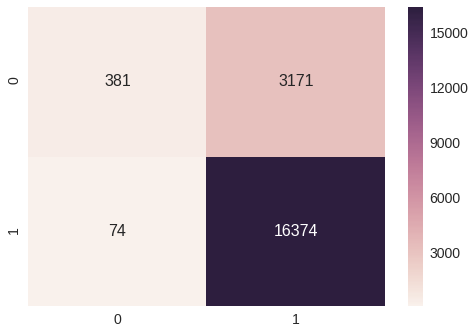

In [0]:
RF= RandomForestClassifier(n_estimators=8,max_depth=150)
RF.fit(x_tr_bi,y_tr)
y_pred =RF.predict(x_test_bi)
print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

## 3.2.3 Feature Importance

In [0]:
RF= RandomForestClassifier(n_estimators=4,max_depth=150)
RF.fit(x_tr_uni,y_tr)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=150, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=4, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [0]:
features=(-RF.feature_importances_).argsort()
print(np.take(bi_gram.get_feature_names(), features))

['asian groceri' 'across soulist' 'aka' ... 'also sangria' 'also richer'
 'balsam vinegar']


## 3.1.4 RandomForest visualisation 

In [0]:
RF= RandomForestClassifier(n_estimators=12,max_depth=150)
RF.fit(x_tr_bi,y_tr)
estimator = RF.estimators_[5]
x_tr_uni_graphviz1=x_tr_uni.todense()
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(estimator,feature_names=bi_gram.get_feature_names(), out_file=dot_data,rounded = True, proportion = False,precision = 2, filled = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# 4 TF-IDF

In [0]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2))
x_tr_tfidf = tf_idf_vect.fit_transform(x_tr)
x_test_tfidf = tf_idf_vect.transform(x_test)

# 4.1 GridSearch

## 4.1.1 Finding the optimal nEstimator & depth using GridsearchCv

Fitting 5 folds for each of 272 candidates, totalling 1360 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:   48.5s
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed: 27.4min
[Parallel(n_jobs=-1)]: Done 1360 out of 1360 | elapsed: 32.8min finished


Best HyperParameter:  {'max_depth': 150, 'n_estimators': 4}
0.8339623675025816


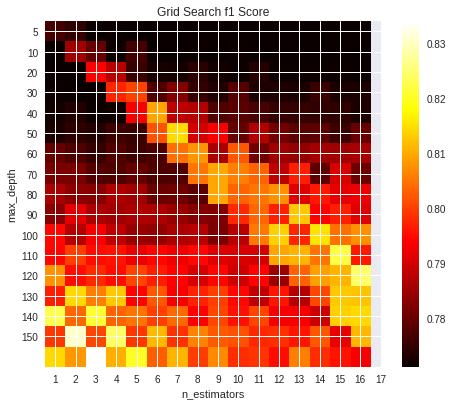

In [0]:
nEstimator = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
depth = [5,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]

RF = RandomForestClassifier()
hyperParam = [{'n_estimators':nEstimator,'max_depth': depth}]
gsv = GridSearchCV(RF,hyperParam,cv=5,verbose=1,scoring='f1_weighted',n_jobs=-1)
gsv.fit(x_tr_tfidf,y_tr)
print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)
scores = gsv.cv_results_['mean_test_score'].reshape(len(nEstimator),len(depth))

plt.figure(figsize=(8, 6))
plt.subplots_adjust(left=.2, right=0.95, bottom=0.15, top=0.95)
plt.imshow(scores, interpolation='nearest', cmap=plt.cm.hot)
plt.xlabel('n_estimators')
plt.ylabel('max_depth')
plt.colorbar()
plt.xticks(np.arange(len(nEstimator)), nEstimator)
plt.yticks(np.arange(len(depth)), depth)
plt.title('Grid Search f1 Score')
plt.show()

## 4.1.2 finding the accuracy in Test data using optimal nEstimator & depth

Accuracy on test set: 84.355%
Precision on test set: 0.757
Recall on test set: 0.610
F1-Score on test set: 0.636


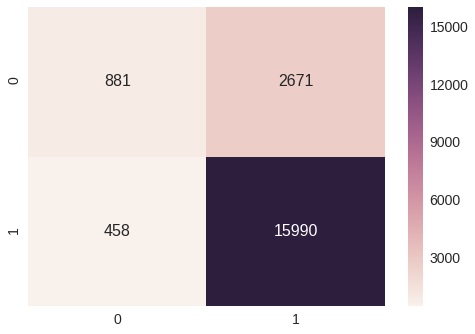

In [0]:
RF= RandomForestClassifier(n_estimators=4,max_depth=150)
RF.fit(x_tr_tfidf,y_tr)
y_pred =RF.predict(x_test_tfidf)
print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

# 4.2 RandomSearchCv

## 4.2.1 Finding the optimal nEstimator & depth using RandomSearchCv

In [0]:
nEstimator = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
depth = [5,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]

RF = RandomForestClassifier()
hyperParam = {'n_estimators':nEstimator,'max_depth': depth}
gsv = RandomizedSearchCV(RF,hyperParam,cv=5,verbose=1,scoring='f1_weighted',n_jobs=-1)
gsv.fit(x_tr_tfidf,y_tr)
print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   58.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   59.9s finished


Best HyperParameter:  {'n_estimators': 4, 'max_depth': 120}
0.8235844274001769


## 4.2.2 finding the accuracy,F1-score in Test data using optimal nEstimator & depth

Accuracy on test set: 83.800%
Precision on test set: 0.770
Recall on test set: 0.571
F1-Score on test set: 0.582


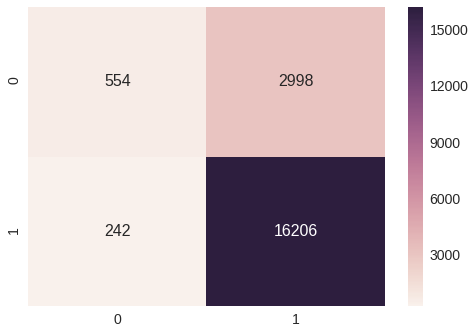

In [0]:
RF= RandomForestClassifier(n_estimators=4,max_depth=120)
RF.fit(x_tr_tfidf,y_tr)
y_pred =RF.predict(x_test_tfidf)
print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

## 4.1.3 Feature Importance

In [0]:
RF= RandomForestClassifier(n_estimators=4,max_depth=150)
RF.fit(x_tr_uni,y_tr)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=150, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=4, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [0]:
features=(-RF.feature_importances_).argsort()
print(np.take(tf_idf_vect.get_feature_names(), features))

['aka' 'bag thermo' 'asian groceri' ... 'also serv' 'also save'
 'balsam vinegar']


## 4.1.4 RandomForest visualisation 

In [0]:
RF= RandomForestClassifier(n_estimators=4,max_depth=120)
RF.fit(x_tr_tfidf,y_tr)
estimator = RF.estimators_[1]
x_tr_uni_graphviz1=x_tr_uni.todense()
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(estimator,feature_names=tf_idf_vect.get_feature_names(), out_file=dot_data,rounded = True, proportion = False,precision = 2, filled = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# 5 Word2Vec

In [0]:
i=0
list_of_sent=[]
for sent in x_tr:
    list_of_sent.append(sent.split())
i=0
list_of_sent_test=[]
for sent in x_test:
    list_of_sent_test.append(sent.split())

In [0]:
w2v_model=Word2Vec(list_of_sent,min_count=5,size=50, workers=4)

In [12]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  1010
sample words  ['big', 'lover', 'fig', 'uniqu', 'flavor', 'kind', 'mix', 'light', 'dark', 'must', 'tri', 'great', 'product', 'good', 'price', 'definit', 'order', 'use', 'bottl', 'empti', 'expect', 'box', 'full', 'fortun', 'cooki', 'like', 'one', 'got', 'small', 'tast', 'weird', 'okay', 'best', 'ever', 'review', 'amazon', 'check', 'label', 'contain', 'sure', 'enough', 'top', 'ingredi', 'ive', 'done', 'research', 'also', 'found', 'pet', 'peopl']


# 6.Avg W2V

In [13]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in list_of_sent: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

800
50


In [14]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sent in list_of_sent_test: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_test.append(sent_vec)
print(len(sent_vectors_test))
print(len(sent_vectors_test[0]))

200
50


In [0]:
x_test_av1=sent_vectors_test
x_tr_av1=sent_vectors

# 6.1 Gridsearch

## 6.1.1 Finding the optimal nEstimator & depth using GridSearchcv 

Fitting 5 folds for each of 272 candidates, totalling 1360 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 1360 out of 1360 | elapsed:  9.4min finished


Best HyperParameter:  {'max_depth': 70, 'n_estimators': 16}
0.8131589146579837


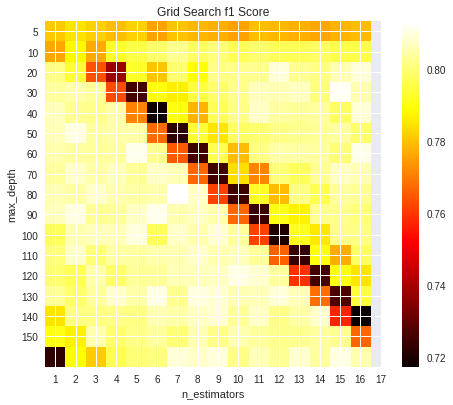

In [0]:
nEstimator = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
depth = [5,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]

RF = RandomForestClassifier()
hyperParam = [{'n_estimators':nEstimator,'max_depth': depth}]
gsv = GridSearchCV(RF,hyperParam,cv=5,verbose=1,scoring='f1_weighted',n_jobs=-1)
gsv.fit(x_tr_av1,y_tr)
print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)
scores = gsv.cv_results_['mean_test_score'].reshape(len(nEstimator),len(depth))

plt.figure(figsize=(8, 6))
plt.subplots_adjust(left=.2, right=0.95, bottom=0.15, top=0.95)
plt.imshow(scores, interpolation='nearest', cmap=plt.cm.hot)
plt.xlabel('n_estimators')
plt.ylabel('max_depth')
plt.colorbar()
plt.xticks(np.arange(len(nEstimator)), nEstimator)
plt.yticks(np.arange(len(depth)), depth)
plt.title('Grid Search f1 Score')
plt.show()

## 6.1.2 finding the accuracy,f1-score in Test data using optimal nEstimator & depth

Accuracy on test set: 82.505%
Precision on test set: 0.880
Recall on test set: 0.508
F1-Score on test set: 0.468


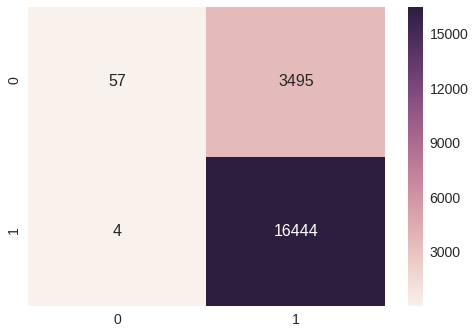

In [0]:
RF= RandomForestClassifier(n_estimators=16,max_depth=70)
RF.fit(x_tr_tfidf,y_tr)
y_pred =RF.predict(x_test_tfidf)
print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

## 6.2 RandomSearchCv

## 6.2.1 Finding the optimal nEstimator & depth using RandomSearchCv

In [0]:
nEstimator = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
depth = [5,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]

RF = RandomForestClassifier()
hyperParam = {'n_estimators':nEstimator,'max_depth': depth}
gsv = RandomizedSearchCV(RF,hyperParam,cv=5,verbose=1,scoring='f1_weighted',n_jobs=-1)
gsv.fit(x_tr_av1,y_tr)
print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   19.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.1s finished


Best HyperParameter:  {'n_estimators': 12, 'max_depth': 150}
0.8101230298752091


## 6.2.2 Finding the optimal nEstimator & depth using GridSearch

Accuracy on test set: 83.495%
Precision on test set: 0.877
Recall on test set: 0.538
F1-Score on test set: 0.526


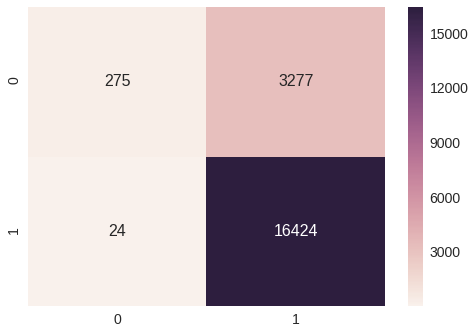

In [0]:
RF= RandomForestClassifier(n_estimators=12,max_depth=150)
RF.fit(x_tr_tfidf,y_tr)
y_pred =RF.predict(x_test_tfidf)
print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

## 6.1.4 RandomForest visualisation 

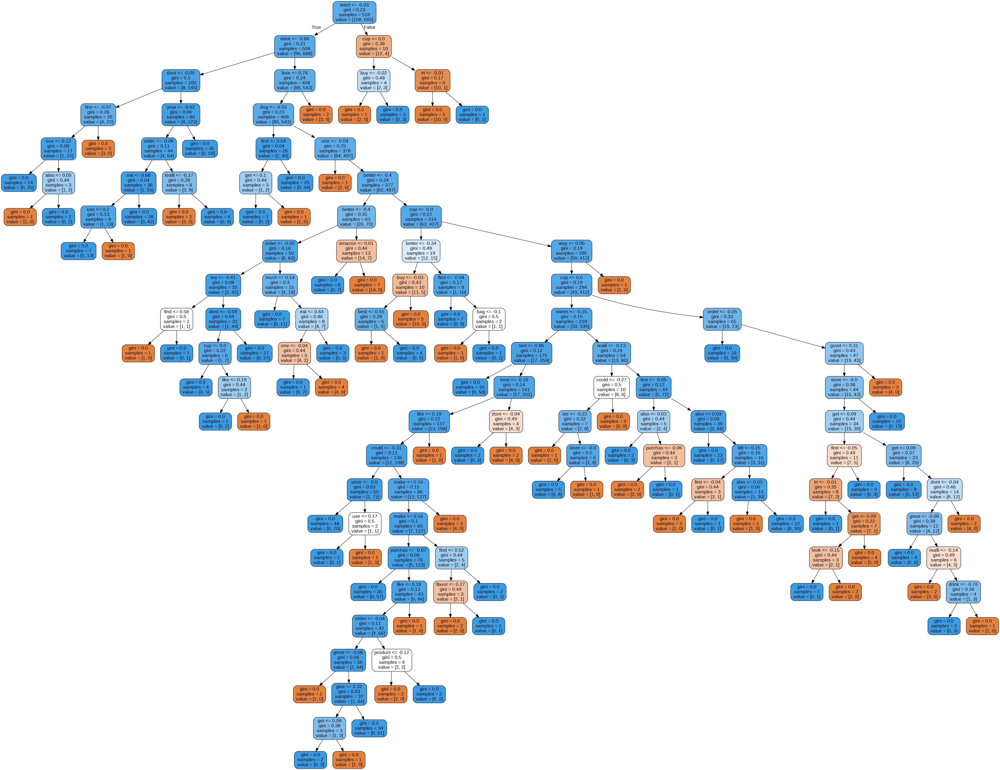

In [0]:
RF= RandomForestClassifier(n_estimators=4,max_depth=120)
RF.fit(x_tr_av1,y_tr)
estimator = RF.estimators_[1]
x_tr_uni_graphviz1=x_tr_uni.todense()
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(estimator,feature_names=w2v_model.wv.index2word, out_file=dot_data,rounded = True, proportion = False,precision = 2, filled = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# 7.TFIDF-W2V

In [0]:
tf_idf_vect = TfidfVectorizer()
final_tf_idf = tf_idf_vect.fit_transform(x_tr)
dictionary = dict(zip(tf_idf_vect.get_feature_names(), list(tf_idf_vect.idf_)))

In [17]:
# TF-IDF weighted Word2Vec
tfidf_feat = tf_idf_vect.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sent): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            tf_idf = dictionary[word]*sent.count(word)
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1

100%|██████████| 800/800 [00:00<00:00, 2206.97it/s]


In [18]:
# TF-IDF weighted Word2Vec
tfidf_feat = tf_idf_vect.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors_test = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sent_test): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            tf_idf = dictionary[word]*sent.count(word)
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_test.append(sent_vec)
    row += 1

100%|██████████| 200/200 [00:00<00:00, 1728.06it/s]


In [0]:
x_test_tdfw2v=tfidf_sent_vectors_test
x_tr_tdfw2v=tfidf_sent_vectors

## 7.1 GridSearch

### 7.1.1 Finding the optimal nEstimator & depth using GridSearch

Fitting 5 folds for each of 272 candidates, totalling 1360 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 1360 out of 1360 | elapsed:  9.6min finished


Best HyperParameter:  {'max_depth': 20, 'n_estimators': 12}
0.8040344842791437


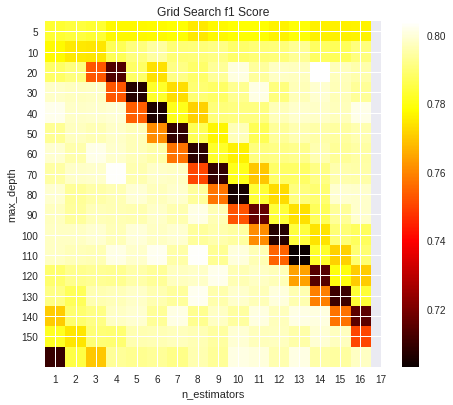

In [0]:
nEstimator = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
depth = [5,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]

RF = RandomForestClassifier()
hyperParam = [{'n_estimators':nEstimator,'max_depth': depth}]
gsv = GridSearchCV(RF,hyperParam,cv=5,verbose=1,scoring='f1_weighted',n_jobs=-1)
gsv.fit(x_tr_tdfw2v,y_tr)
print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)
scores = gsv.cv_results_['mean_test_score'].reshape(len(nEstimator),len(depth))

plt.figure(figsize=(8, 6))
plt.subplots_adjust(left=.2, right=0.95, bottom=0.15, top=0.95)
plt.imshow(scores, interpolation='nearest', cmap=plt.cm.hot)
plt.xlabel('n_estimators')
plt.ylabel('max_depth')
plt.colorbar()
plt.xticks(np.arange(len(nEstimator)), nEstimator)
plt.yticks(np.arange(len(depth)), depth)
plt.title('Grid Search f1 Score')
plt.show()

### 7.1.2 finding the accuracy in Test data using optimal nEstimator & depth

Accuracy on test set: 84.115%
Precision on test set: 0.877
Recall on test set: 0.557
F1-Score on test set: 0.559


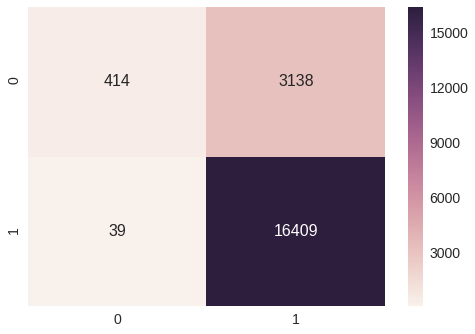

In [0]:
RF= RandomForestClassifier(n_estimators=12,max_depth=200)
RF.fit(x_tr_tdfw2v,y_tr)
y_pred =RF.predict(x_test_tdfw2v)
print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

# 7.2 RandomSearchcv


### 7.2.1 Finding the optimal nEstimator & depth using RandomSearch

In [0]:
nEstimator = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
depth = [5,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]

RF = RandomForestClassifier()
hyperParam = {'n_estimators':nEstimator,'max_depth': depth}
gsv = RandomizedSearchCV(RF,hyperParam,cv=5,verbose=1,scoring='f1_weighted',n_jobs=-1)
gsv.fit(x_tr_tdfw2v,y_tr)
print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   22.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.4s finished


Best HyperParameter:  {'n_estimators': 14, 'max_depth': 60}
0.8012191548299826


## 7.1.2 finding the accuracy,F1-score in Test data using optimal nEstimator & depth

Accuracy on test set: 82.400%
Precision on test set: 0.897
Recall on test set: 0.505
F1-Score on test set: 0.461


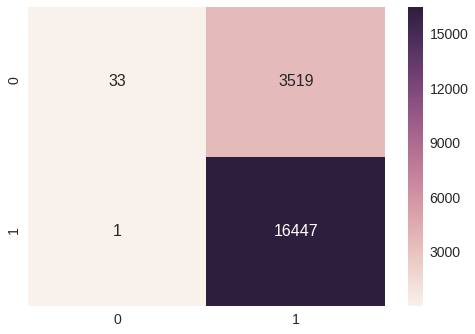

In [0]:
RF= RandomForestClassifier(n_estimators=14,max_depth=60)
RF.fit(x_tr_tdfw2v,y_tr)
y_pred =RF.predict(x_test_tdfw2v)
print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

## 7.1.4 RandomForest visualisation 

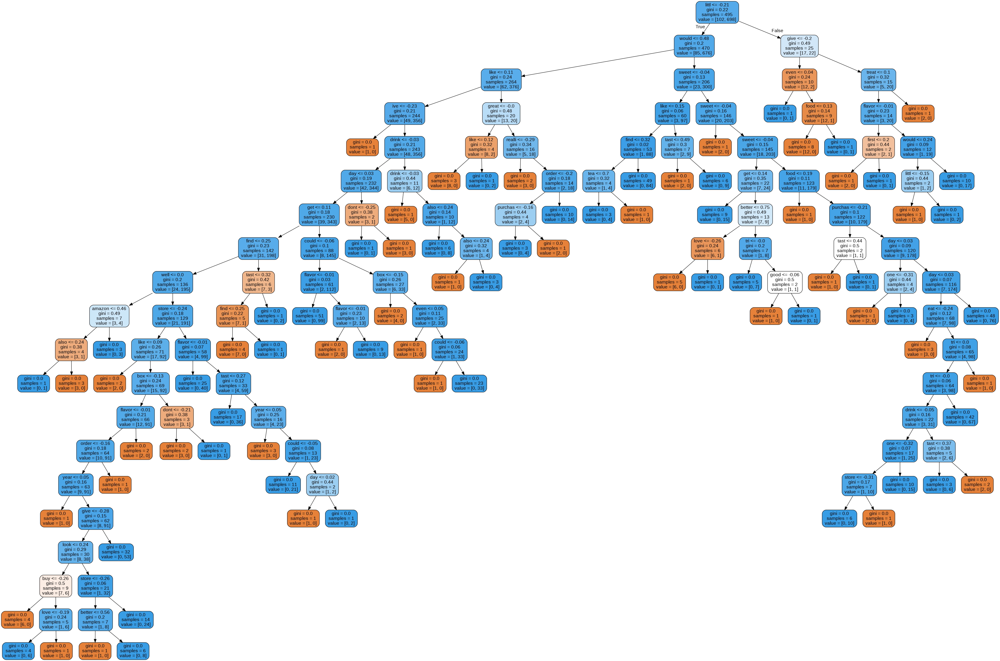

In [29]:
RF= RandomForestClassifier(n_estimators=4,max_depth=120)
RF.fit(x_tr_tdfw2v,y_tr)
estimator = RF.estimators_[1]
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(estimator,feature_names=w2v_model.wv.index2word[:50], out_file=dot_data,rounded = True, proportion = False,precision = 2, filled = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# GridSearch Conclusion

In [1]:
resultGridSearch = {

'Model': ['unigram', 'Bi-gram', 'Tf-IDF', 'Av-Word2Vec','Tf-IDF Word2vec'],
'Max-Depth': ['150', '140', '150', '70','20'],
'n_estimator': [12,4,4,16,12],
'F1score test': [0.713,0.566,0.636,0.461,0.559],
'accuracy Test': ['87.030%','83.510%','84.35%','82.305%','84.115%']
}
pd.DataFrame(resultGridSearch)

,Model,Max-Depth,n_estimator,F1score test,accuracy Test
0,unigram,150,12,0.713,87.030%
1,Bi-gram,140,4,0.566,83.510%
2,Tf-IDF,150,4,0.636,84.35%
3,Av-Word2Vec,70,16,0.461,82.305%
4,Tf-IDF Word2vec,20,12,0.559,84.115%


# RandomSearch Conclusion

In [2]:
resultRandomSearch = {

'Model': ['unigram', 'Bi-gram', 'Tf-IDF', 'Av-Word2Vec','Tf-IDF Word2vec'],
'Max-Depth': ['140', '150', '120', '150','60'],
'n_estimator': [8,8,4,12,14],
'F1score test': [0.681,0.550,0.582,0.526,0.461],
'accuracy Test': ['87.030%','83.510%','84.35%','82.305%','84.115%']
}
pd.DataFrame(resultRandomSearch)

,Model,Max-Depth,n_estimator,F1score test,accuracy Test
0,unigram,140,8,0.681,87.030%
1,Bi-gram,150,8,0.550,83.510%
2,Tf-IDF,120,4,0.582,84.35%
3,Av-Word2Vec,150,12,0.526,82.305%
4,Tf-IDF Word2vec,60,14,0.461,84.115%
